# Read and plot run database

## Imports

In [1]:
import pandas as pd
import numpy as np
import sqlite3
import plotly.tools as tls
from plotly.graph_objs import Bar, Scatter, Marker, Layout 
import datetime as dt
from IPython.display import display
from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.graph_objs as go
import matplotlib.pyplot as plt
%matplotlib inline

print __version__ # requires version >= 1.9.0

2.0.15


## connect to database
I dump the basic run by run info in a sqlite database. The input data to this db is generated by several scripts.

In [2]:
conn = sqlite3.connect('/home/frederik/Analysis/Hindenburg/runDB.db')

### Test query

In [3]:
sql_cmd =  "SELECT * FROM runs WHERE run_nr BETWEEN 5429 AND 5440;"
df = pd.read_sql_query(sql_cmd, conn)
df.head()

,run_nr,rate_plane0,rate_plane1,rate_plane2,rate_plane3,eff_plane0,eff_plane1,eff_plane2,eff_plane3,time,runtime,track_rate
0,5429,2.153131e+06,1.865883e+06,1.289444e+06,1.106127e+06,0.977099,0.944923,0.768840,0.688255,2017-08-23 06:39:51.374477,7.934575,937302.997181
1,5430,2.153633e+06,1.862492e+06,1.287148e+06,1.109684e+06,0.977272,0.943635,0.766137,0.689121,2017-08-23 06:41:30.092547,7.935360,923391.368881
2,5431,2.169211e+06,1.876421e+06,1.295363e+06,1.118017e+06,0.977154,0.944113,0.766180,0.689442,2017-08-23 06:43:08.429624,7.882932,941111.478272
3,5432,2.151003e+06,1.856911e+06,1.284501e+06,1.112334e+06,0.977166,0.942690,0.764685,0.690368,2017-08-23 06:44:47.482687,7.950566,921717.217821
4,5433,2.174221e+06,1.880616e+06,1.306409e+06,1.123678e+06,0.977047,0.944257,0.768803,0.690222,2017-08-23 06:46:25.745764,7.862486,953868.425673


## Get the data

In [49]:
sql_cmd = "SELECT run_nr, rate_plane0, rate_plane1, rate_plane2, rate_plane3, runtime, time, eff_plane0, eff_plane1, eff_plane2, eff_plane3, track_rate FROM runs WHERE run_nr < 13800 and runtime < 10000 ;"
df = pd.read_sql_query(sql_cmd, conn)
sql_cmd = "SELECT time, hv FROM hv WHERE time > '2017-07-02 21:00:00';"
df_hv = pd.read_sql_query(sql_cmd, conn)
df_hv.head()

,time,hv
0,2017-8-7 16:8:4,-0.002527
1,2017-8-7 16:8:9,-0.001764
2,2017-8-7 16:8:14,-0.001860
3,2017-8-7 16:8:19,-0.002456
4,2017-8-7 16:8:24,-0.001049


## Plot the data

In [50]:
init_notebook_mode(connected=True)

### Rates Vs Time

In [51]:
rate0 = go.Scattergl(
    x = df.time,
    y = df.rate_plane0,
    mode = 'markers',
    name = 'rate plane 0',
    marker = dict( size = 3 )
)
rate1 = go.Scattergl(
    x = df.time,
    y = df.rate_plane1,
    mode = 'markers',
    name = 'rate plane 1',
    marker = dict( size = 3 )
)
rate2 = go.Scattergl(
    x = df.time,
    y = df.rate_plane2,
    mode = 'markers',
    name = 'rate plane 2',
    marker = dict( size = 3 )
)
rate3 = go.Scattergl(
    x = df.time,
    y = df.rate_plane3,
    mode = 'markers',
    name = 'rate plane 3',
    marker = dict( size = 3 )
)
rate_tracks = go.Scattergl(
    x = df.time,
    y = df.track_rate,
    mode = 'markers',
    name = 'track_rate',
    marker = dict( size = 3 )
)
data1 = [rate0,rate1,rate2,rate3,rate_tracks]
iplot({ 'data': data1,
        'layout': Layout(xaxis={'title': 'Time'}, 
                         yaxis={'title': 'Rate (Hz)','range':[1.5,7],'type':'log'},
                         title='Mupix 7 hit rate over the run' )
      }, filename='test')

We have rougly 3 drunning periods:

* 1.5 days at ~2 MHz, followed by ~2.5 days with no beam

* about 3 days at ~2 MHz, followed by ~4 days with no beam

* 5.5 days with lower intensity, with running roughly 50/50 for 150 and 300 kHz, and one shift at 2 MHz



### Run time Versus Rate

(10000, 10000000)

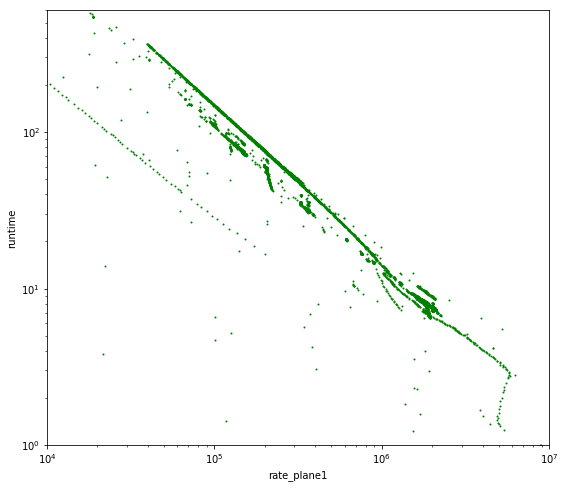

In [52]:
ax = df.plot.scatter(x='rate_plane1',y='runtime',c='g',s=1,logy=True,logx=True,figsize=(9,8))
ax.set_ylim(1,600)
ax.set_xlim(10000,10000000)

There is a strong correlation between the run (file) length and the MuPix trigger rate. When running at ~2 MHz, the data files are less then 10 s long

## DAQ lifetime

In [53]:
df['time_difference_runs'] = pd.to_datetime(df.time,errors='coerce').diff().dt.seconds
df['daq_lifetime'] = 100*df.runtime.div(df.time_difference_runs)

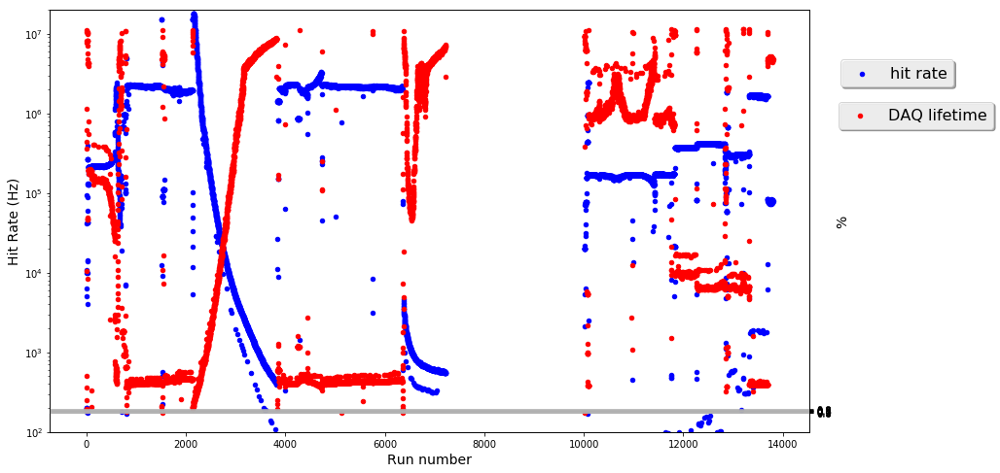

In [54]:
ax = df.plot.scatter(x='run_nr',y='rate_plane0',logy=True,c ='b',figsize=(14,8),legend=True,label='hit rate')
ax.set_ylim(100,20000000)
plt.xlabel('Run number',fontsize=14)
plt.ylabel('Hit Rate (Hz)',fontsize=14)
ax2 = ax.twinx()
df.plot.scatter(x='run_nr',y='daq_lifetime',ax=ax2, secondary_y=True,c='r',grid=True,legend=True, yticks=np.arange(0,1,0.1),label='DAQ lifetime')
lines, labels = ax.get_legend_handles_labels()
ax.legend(lines, labels, fontsize=16,shadow=True,bbox_to_anchor=(1.2, 0.9)) 
lines, labels = ax2.get_legend_handles_labels()
ax2.legend(lines, labels, fontsize=16,shadow=True,bbox_to_anchor=(1.252, 0.8))
ax2.set_ylabel('%',fontsize=14)
plt.show()

As a consequency of the high data rate, the DAQ livetime is low during the 2 MHz data taking: 10% or less. At a few 100 kHz, the DAQ lifetime is above 80%.

### Efficiency
Defined as "3 planes see a 3 hits coincident in time" => "has the 4th plane a hit?"

In [55]:
eff0 = go.Scattergl(
    x = df.time,
    y = df.eff_plane0*100,
    mode = 'markers',
    name = 'efficiency plane 0',
    marker = dict( size = 3 )
)
eff1 = go.Scattergl(
    x = df.time,
    y = df.eff_plane1*100,
    mode = 'markers',
    name = 'efficiency plane 1',
    marker = dict( size = 3 )
)
eff2 = go.Scattergl(
    x = df.time,
    y = df.eff_plane2*100,
    mode = 'markers',
    name = 'efficiency plane 2',
    marker = dict( size = 3 )
)
eff3 = go.Scattergl(
    x = df.time,
    y = df.eff_plane3*100,
    mode = 'markers',
    name = 'efficiency plane 3',
    marker = dict( size = 3 )
)

In [56]:
data2 = [eff0,eff1,eff2,eff3]
iplot({ 'data': data2,
        'layout': Layout(xaxis={'title': 'Time'}, 
                         yaxis={'title': 'Efficiency'},
                         title='Mupix 7 hit rate over the run' )
      }, filename='test')

In [59]:
hv = go.Scattergl(
    x = df_hv.hv,
    y = df_hv.time,
    mode = 'markers',
    name = 'high voltage',
    marker = dict( size = 3 )
)

In [60]:
data3 = [hv]
iplot({ 'data': data3,
        'layout': Layout(xaxis={'title': 'Time'}, 
                         yaxis={'title': 'HV (V)'},
                         title='Mupix 7 hv over the run' )
      }, filename='test')
#df_hv.time

0          2017-8-7 16:8:4
1          2017-8-7 16:8:9
2         2017-8-7 16:8:14
3         2017-8-7 16:8:19
4         2017-8-7 16:8:24
5         2017-8-7 16:8:48
6         2017-8-7 16:8:53
7         2017-8-7 16:8:58
8          2017-8-7 16:9:3
9          2017-8-7 16:9:8
10        2017-8-7 16:9:13
11        2017-8-7 16:9:18
12        2017-8-7 16:9:23
13        2017-8-7 16:9:28
14        2017-8-7 16:9:33
15        2017-8-7 16:9:38
16        2017-8-7 16:9:43
17        2017-8-7 16:9:48
18        2017-8-7 16:10:1
19        2017-8-7 16:10:6
20       2017-8-7 16:10:11
21       2017-8-7 16:10:16
22       2017-8-7 16:10:21
23       2017-8-7 16:10:26
24       2017-8-7 16:10:31
25       2017-8-7 16:10:36
26       2017-8-7 16:10:41
27       2017-8-7 16:10:46
28       2017-8-7 16:10:51
29       2017-8-7 16:10:56
               ...        
58308    2017-9-4 10:58:49
58309    2017-9-4 10:58:54
58310    2017-9-4 10:58:59
58311     2017-9-4 10:59:4
58312     2017-9-4 10:59:9
58313    2017-9-4 10:59:14
5